In [86]:
from glob import glob
from datetime import date
from progressbar import progressbar

from matplotlib import pyplot as plt
from skan import draw
import numpy as np
from skimage import exposure
import skimage as ski
from scipy.ndimage import minimum_filter, maximum_filter

# Then import the radial hydride packagess
from HAPPY import import_image
from HAPPY import cropping_functions as crop
from HAPPY import plot_functions as plt_f
from HAPPY import radial_hydride_fraction as RHF
from HAPPY import branching as branch
from HAPPY import crack_path as cp
from HAPPY import image_processing
from HAPPY import threshold

%matplotlib inline

In [87]:
image_dict = dict([(f'image{i}',j) for i,j in enumerate(sorted(glob('data/Micrographs_Used_To_Test_Code/*'))[::-1])])
image_dict

{'image0': 'data/Micrographs_Used_To_Test_Code/520-7b.png',
 'image1': 'data/Micrographs_Used_To_Test_Code/520-6m.png',
 'image2': 'data/Micrographs_Used_To_Test_Code/520-6h.png',
 'image3': 'data/Micrographs_Used_To_Test_Code/520-5m.png',
 'image4': 'data/Micrographs_Used_To_Test_Code/520-5b.png',
 'image5': 'data/Micrographs_Used_To_Test_Code/1810A(16).bmp',
 'image6': 'data/Micrographs_Used_To_Test_Code/1807A(428).bmp',
 'image7': 'data/Micrographs_Used_To_Test_Code/1806A(293).bmp',
 'image8': 'data/Micrographs_Used_To_Test_Code/1805A.bmp',
 'image9': 'data/Micrographs_Used_To_Test_Code/1805A(238).bmp',
 'image10': 'data/Micrographs_Used_To_Test_Code/1805A(236).bmp'}

In [88]:
Scale_Bar_Micron_Value = 100
#Input how many pixels are in your scale bar
Pixels_In_Scale_Bar = 165.5
Scale_Bar_Value_In_Meters = Scale_Bar_Micron_Value*(1e-6)
scale = Scale_Bar_Value_In_Meters/Pixels_In_Scale_Bar 
scale_um = scale*1e6

In [89]:
def produce_cropped_image(img_fpath,transpose=False,bottom_crop=50, verbose=False):
    og_img = import_image.image(image_path = img_fpath, transpose = transpose)
    cropped_image = crop.cropImage(og_img, crop_bottom=bottom_crop, crop_top=0, crop_left=0, crop_right=0)
    crop1 = cropped_image
    # Input the value of the scale bar in microns
    Scale_Bar_Micron_Value = 100
    #Input how many pixels are in your scale bar
    Pixels_In_Scale_Bar = 165.5
    Scale_Bar_Value_In_Meters = Scale_Bar_Micron_Value*(1e-6)
    scale = Scale_Bar_Value_In_Meters/Pixels_In_Scale_Bar 
    scale_um = scale*1e6
    location = 'lower right'

    cropped_image, crop_threshold = crop.cropping_tube(cropped_image, 
                                                   crop_param = 0.2, size_param = 1000, dilation_param = 10)

    # Plot comparison
    if verbose == True:
        plt_f.plot_comparison(crop1, 'Original image crop', cropped_image, 'Tube crop',scale=scale, 
                           location=location)

    return cropped_image,crop_threshold

In [96]:
def plot_thres2(img_fpath,transpose=False,bottom_crop=50,scale=None, location=None, ax=None):
    """Plotting an imge.
    
    Parameters
    ----------
    img : array
        Image data to be plotted
    title : str
        Title of plot.
    scale : float
        Scale in meters per pixel.
    location : str
        Location of scale bar i.e. 'lower right', 'upper left'
    """

    og_image = import_image.image(image_path = img_fpath, transpose = transpose)
    og_cropped_image = crop.cropImage(og_image, crop_bottom=bottom_crop, crop_top=0, crop_left=0, crop_right=0)
    img,crop_threshold = produce_cropped_image(img_fpath,transpose=transpose,bottom_crop=bottom_crop,verbose=False)
    
    li_thres = threshold.threshold_li(img)
    otsu_thres = threshold.threshold_otsu(img)
    yen_thres = threshold.threshold_yen(img)
    niblack_thres = ski.filters.threshold_niblack(og_cropped_image,window_size=15,k=0.2)
    sauvola_thres = ski.filters.threshold_sauvola(og_cropped_image,window_size=15)
    

    
    print(f'Li:{li_thres}')
    print(f'Otsu:{otsu_thres}')
    print(f'Yen:{yen_thres}')
    """
    niblack_image = og_cropped_image < niblack_thres
    niblack_image[crop_threshold] = np.nan
    sauvola_image = og_cropped_image < sauvola_thres
    sauvola_image[crop_threshold] = np.nan
    """

    li_image = image_processing.simple_threshold(img, crop_threshold, 
                                          threshold = li_thres, small_obj = 0)
    otsu_image = image_processing.simple_threshold(img, crop_threshold, 
                                          threshold = otsu_thres, small_obj = 0)

    yen_image = image_processing.simple_threshold(img, crop_threshold, 
                                          threshold = yen_thres, small_obj = 0)
    niblack_image = image_processing.simple_threshold(img, crop_threshold, 
                                          threshold = niblack_thres, small_obj = 0)
    sauvola_image = image_processing.simple_threshold(img, crop_threshold, 
                                      threshold = sauvola_thres, small_obj = 0)

    min_image = minimum_filter(og_cropped_image,size=5)
    max_image = maximum_filter(og_cropped_image,size=5)

    segments_cv = ski.segmentation.chan_vese(img,mu=0.1)

    
    images = [og_cropped_image,li_image, otsu_image,niblack_image,sauvola_image,segments_cv,min_image,max_image]
    titles = [img_fpath.split('/')[-1],'li', "Otsu",'niblack','sauvola','chase','min','max']
    
    # Set up a 2x3 grid for the images
    fig, axs = plt.subplots(4, 2, figsize=(10, 16))  # Adjust figsize as needed
    
    # Flatten the 2x3 array of axes to make iteration easier
    axs = axs.flatten()
    
    # Loop over each image and corresponding title
    for i, (img, title) in enumerate(zip(images, titles)):
        axs[i].imshow(img, cmap='gray')  # Use cmap='gray' for grayscale, remove it for color
        axs[i].set_title(title)
        axs[i].axis('off')  # Hide the axes
    
    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()

Li:0.7117141386581866
Otsu:0.7370675222120099
Yen:0.6686249762561275


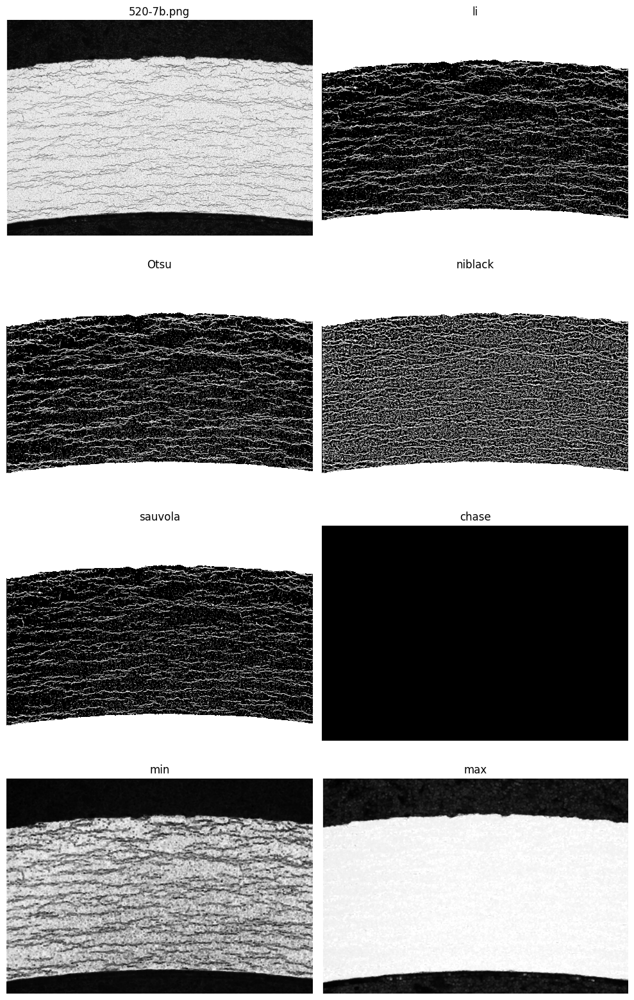

Li:0.6530983702120039
Otsu:0.6894760899203431
Yen:0.6670824042585786


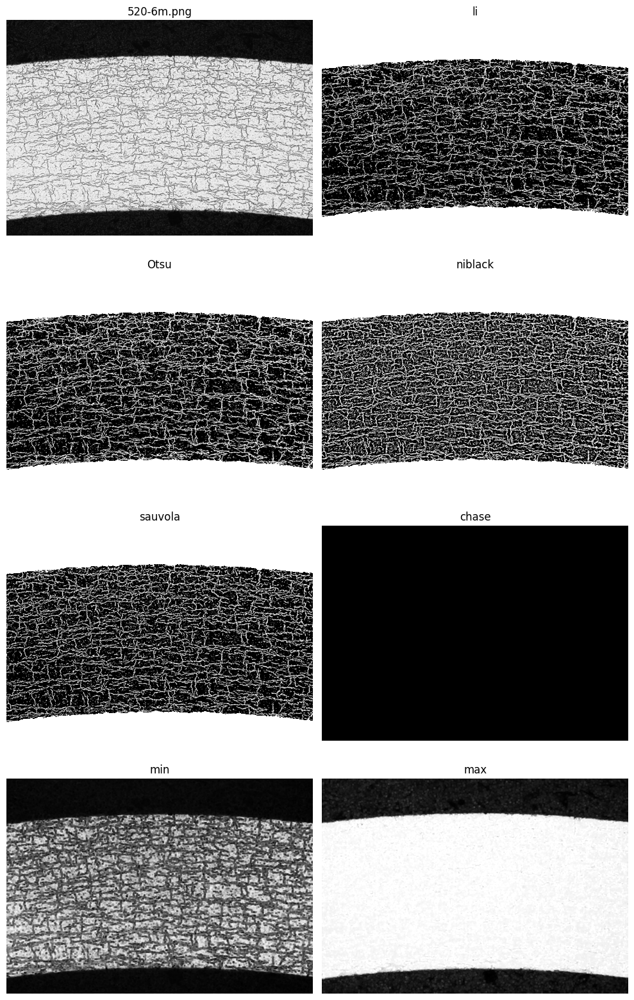

Li:0.7348057768533954
Otsu:0.7566409535845589
Yen:0.6969947035845588


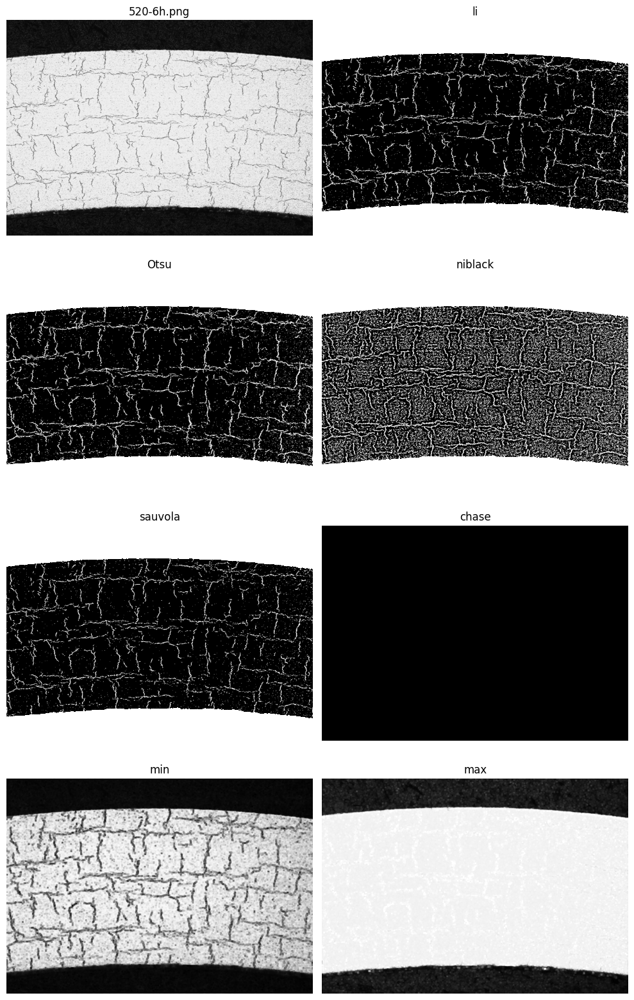

Li:0.7121891569653065
Otsu:0.7389079871323531
Yen:0.6997422579656863


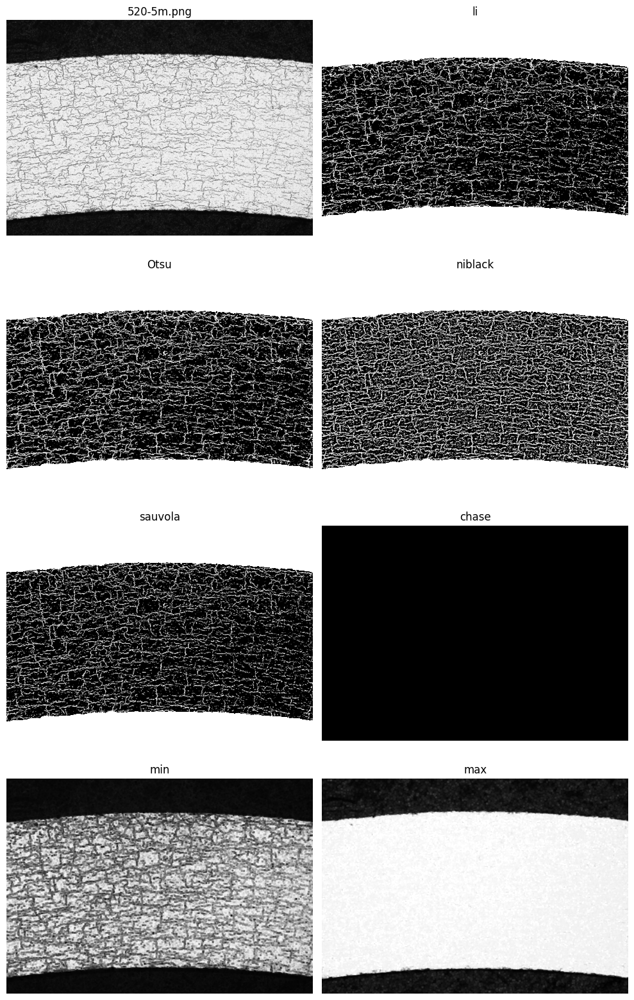

Li:0.6908606452294725
Otsu:0.7236415693933823
Yen:0.7345102688419117


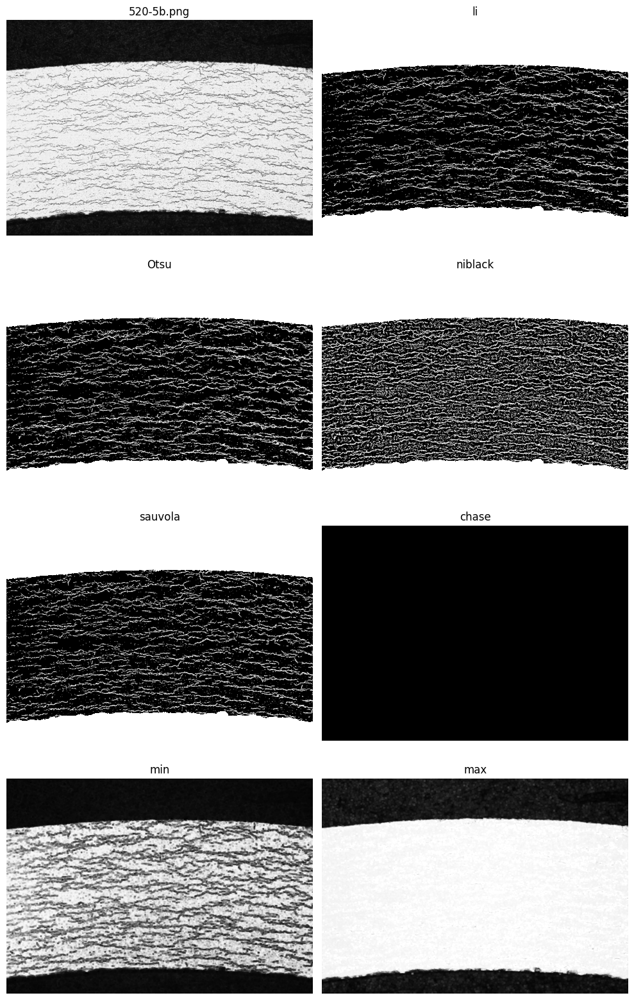

Li:0.48765665525554786
Otsu:0.5693933823529411
Yen:0.5269301470588236


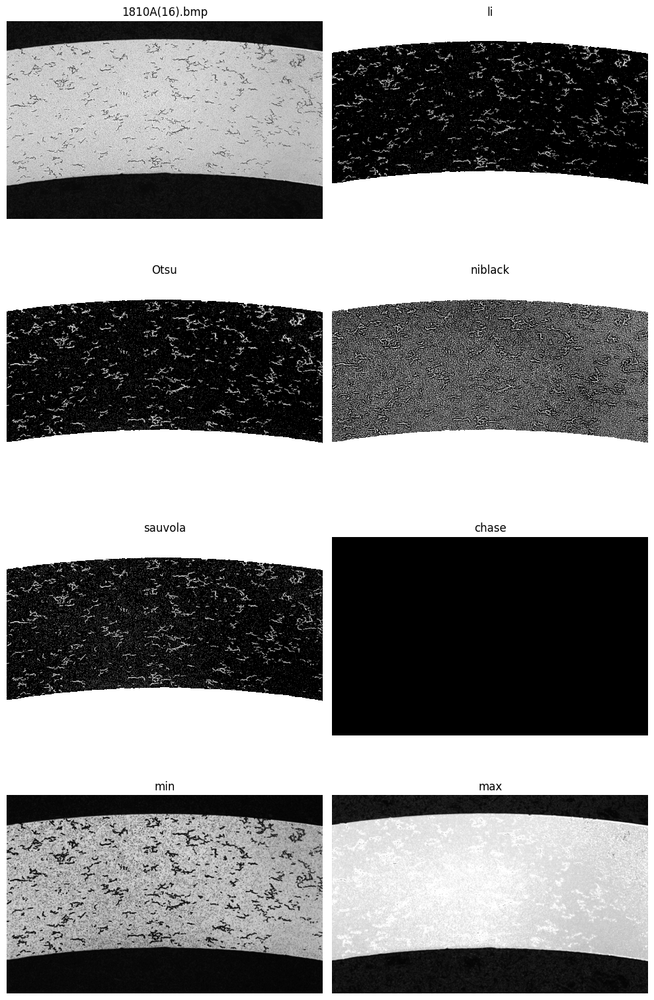

Li:0.5035390215382629
Otsu:0.5693933823529411
Yen:0.5307904411764706


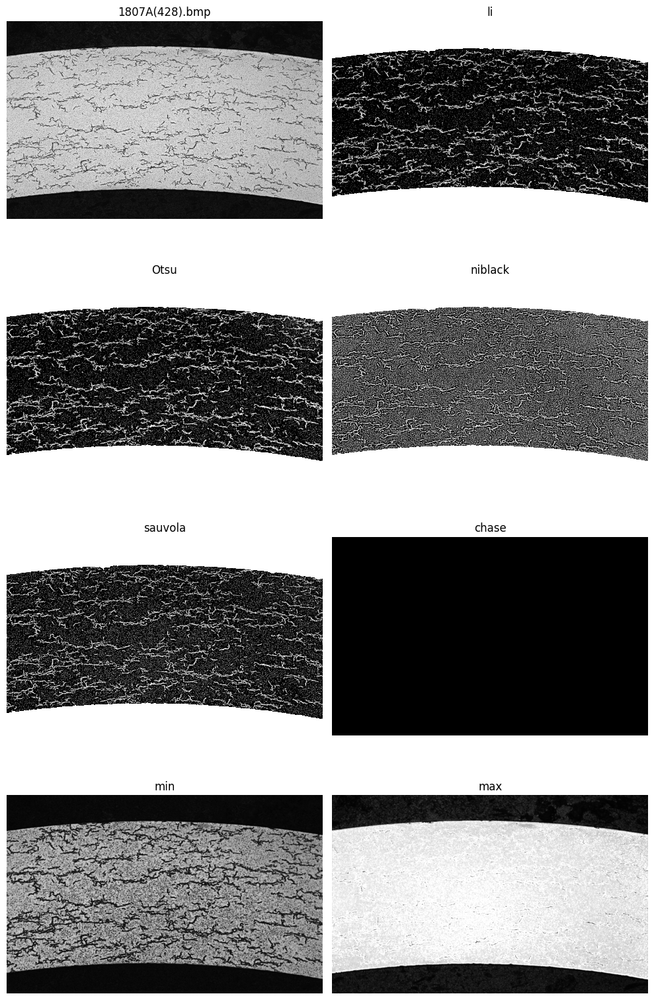

Li:0.48356355431748865
Otsu:0.5677389705882353
Yen:0.5826899509803922


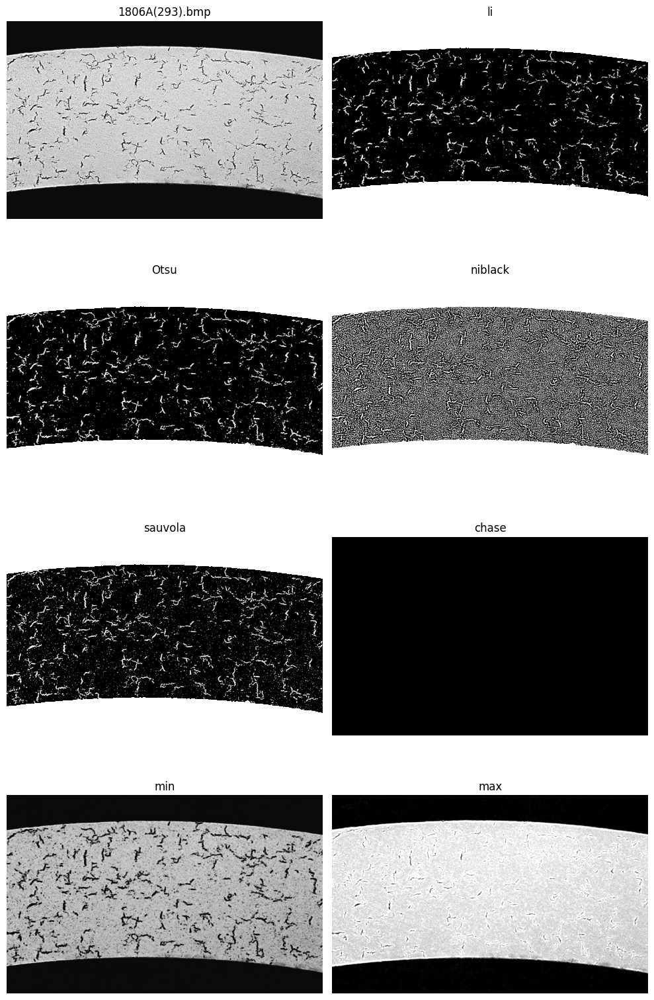

Li:0.576724549415373
Otsu:0.6178308823529413
Yen:0.5646446078431373


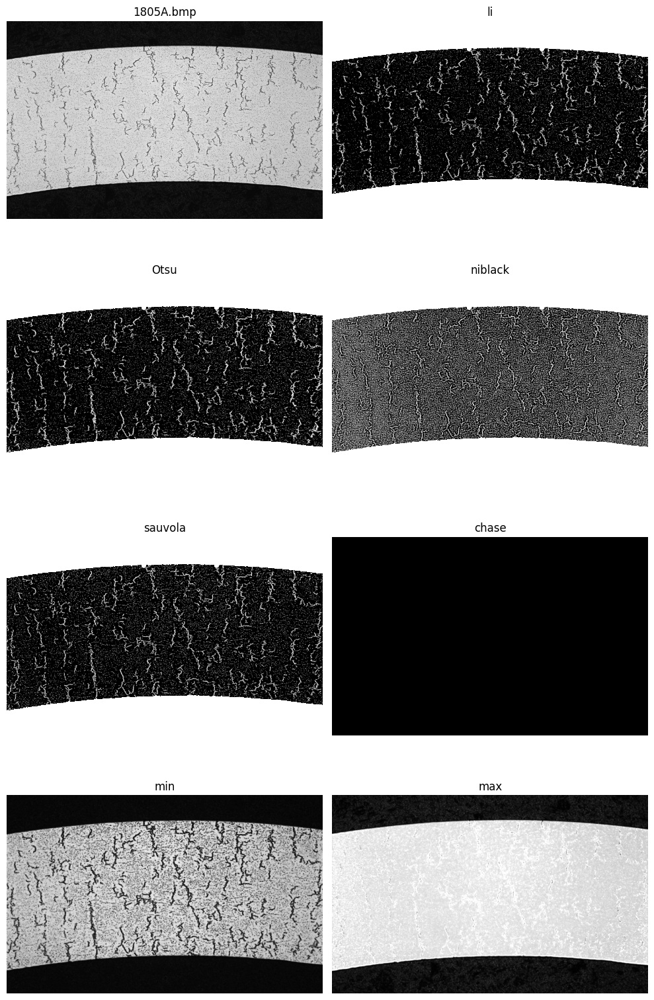

Li:0.7342924738873479
Otsu:0.7396752450980393
Yen:0.46681985294117645


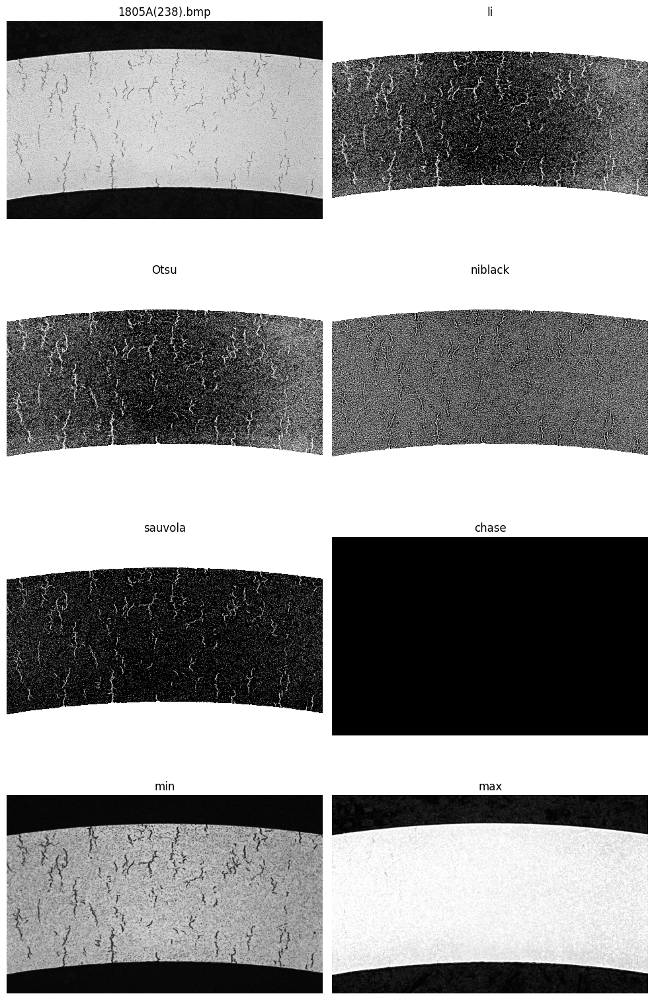

Li:0.5225861914888479
Otsu:0.5925551470588235
Yen:0.5423713235294119


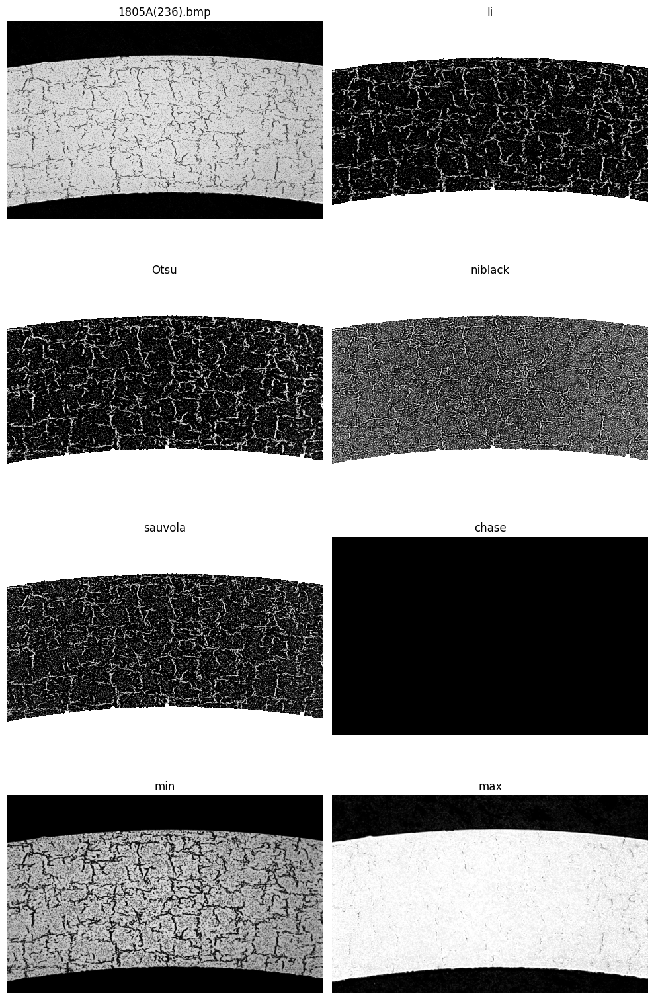

In [97]:

for f in image_dict.values():
    #_,ax = plt_f.plot_hist(produce_cropped_image(f),title=f.split('\\')[-1])
    if '520-' in f:
        plot_thres2(f,transpose=False,bottom_crop=50)
    else:
        plot_thres2(f,transpose=True,bottom_crop=250)

In [5]:
def show_histogram_thresholds(img_fpath,transpose=False,bottom_crop=50,title='Image'):
    """Plotting an imge.

    """
    img,crop_threshold = produce_cropped_image(img_fpath,transpose=transpose,bottom_crop=bottom_crop)
    
    li_thres = threshold.threshold_li(img)
    otsu_thres = threshold.threshold_otsu(img)
    tri_thres = threshold.threshold_triangle(img)
    yen_thres = threshold.threshold_yen(img)
    iso_thres = threshold.threshold_isodata(img)

    vertical_lines = [li_thres,otsu_thres,tri_thres,yen_thres,iso_thres]
    labels = ['li','otsu','tri','yen','iso']

    _,ax = plt_f.plot_hist(img,title=title)
    
    i = 0.2
    for x, label in zip(vertical_lines, labels):
        ax.axvline(x=x, color='green', linestyle='--', linewidth=1.5)  # Draw vertical line
        ax.text(x, ax.get_ylim()[1] * i, label, rotation=90, color='red',
                verticalalignment='center', horizontalalignment='right')
        i += 0.1

    return _,ax